**Deep Learning - Trabalho Conclusão de Módulo**

> 27/04/2024




**Integrantes**

- André Luiz Pires Guimarães
- Daniel de Souza Miranda
- Iago Nery Mendes
- Lucas Elias de Andrade Cruvinel
- Victor Hugo Brito da Silva Miranda

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error

In [2]:
df_milk = pd.read_csv("RecurrentNeuralNetwork/milk.csv", parse_dates=["Date"])
df_milk.dropna(how='any', axis=0, inplace=True, ignore_index=True)
df_milk.shape

(25846, 10)

In [3]:
# Nome da coluna que deseja mover para a última posição
coluna = 'milk_production'

# Remover a coluna do DataFrame
coluna_removida = df_milk.pop(coluna)

# Inserir a coluna removida na última posição
df_milk.insert(len(df_milk.columns), coluna, coluna_removida)

In [4]:
df_milk.head()

,AnEar,Date,lactation,dim,MilkShif,Cond,Dur,Peak,dim2,milk_production
0,123,2023-01-09,4,1,11.50,5.420,276.0,6.7,1,11.5
1,123,2023-01-10,4,2,24.20,4.945,384.0,15.0,2,48.4
2,123,2023-01-11,4,3,33.20,5.060,672.0,15.5,3,66.4
3,123,2023-01-12,4,4,28.55,4.940,354.0,16.4,4,57.1
4,123,2023-01-13,4,5,39.25,5.055,396.0,17.0,5,78.5


In [5]:
df_milk.tail()

,AnEar,Date,lactation,dim,MilkShif,Cond,Dur,Peak,dim2,milk_production
25841,9977,2023-12-13,2,301,36.40,4.980,540.0,13.8,301,72.8
25842,9977,2023-12-14,2,302,36.50,4.700,600.0,12.9,302,73.0
25843,9977,2023-12-15,2,303,35.45,5.075,540.0,13.3,303,70.9
25844,9977,2023-12-16,2,304,35.30,4.955,516.0,12.0,304,70.6
25845,9977,2023-12-17,2,305,33.85,4.960,522.0,12.3,305,67.7


In [6]:
df_milk['AnEar'].value_counts()

AnEar
123     305
8947    305
9066    305
9078    305
9081    305
       ... 
9525    304
9549    304
8064    304
7761    301
8732    259
Name: count, Length: 85, dtype: int64

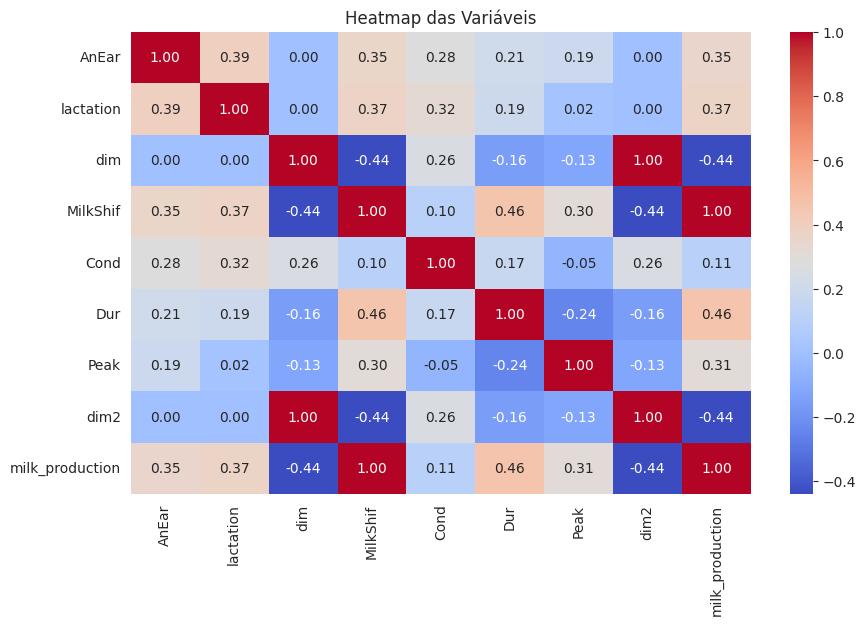

In [7]:
#Definindo as variáveis para o heatmap
variaveis = ['AnEar', 'lactation', 'dim', 'MilkShif', 'Cond', 'Dur', 'Peak', 'dim2', 'milk_production']

#Criando o heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(df_milk[variaveis].corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Heatmap das Variáveis')
plt.show() 

Text(0.5, 1.0, 'Produção de Leite')

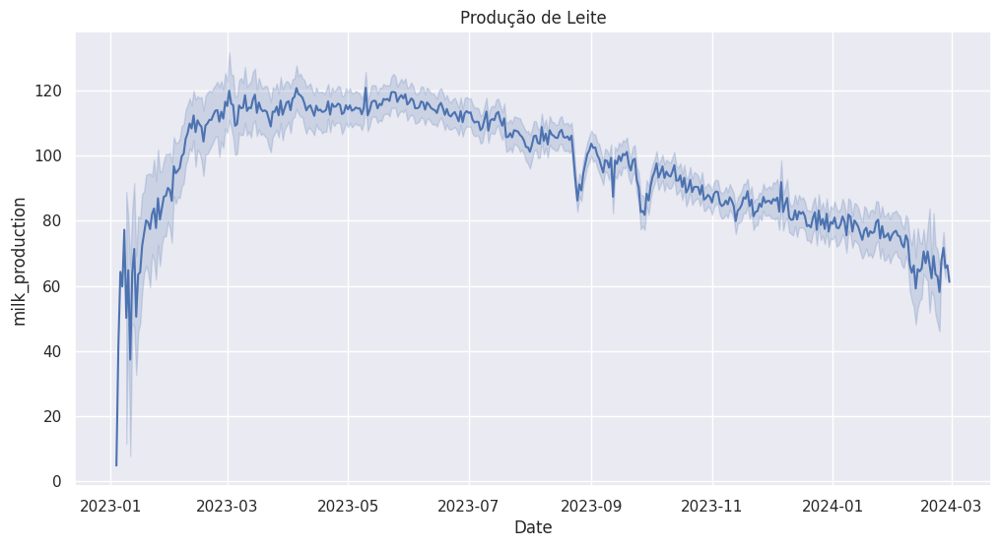

In [8]:
sns.set(style="darkgrid")
plt.figure(figsize=(12,6))
sns.lineplot(x=df_milk["Date"], y="milk_production", data=df_milk).set_title("Produção de Leite")

Armotizando a visualização:

<Axes: xlabel='Date'>

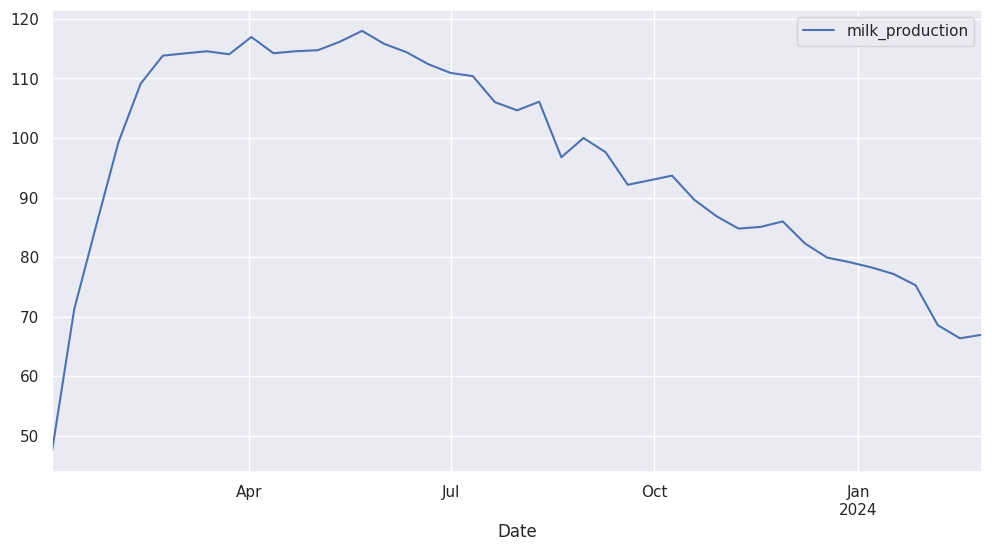

In [9]:
df_milk_am = pd.read_csv("RecurrentNeuralNetwork/milk.csv", parse_dates=["Date"])[["milk_production", "Date"]]
df_milk_am.set_index("Date", inplace=True)
df_milk_am.resample('10D').mean().plot(figsize=(12,6))

In [10]:
df_milk_copy = df_milk.copy()

In [11]:
#df_milk.drop('AnEar'#df_milk., axis=1, inplace=True)
df_milk.drop('Date', axis=1, inplace=True)
df_milk.drop('Cond', axis=1, inplace=True)
df_milk.drop('Dur', axis=1, inplace=True)
df_milk.drop('Peak', axis=1, inplace=True)
df_milk.drop('dim2', axis=1, inplace=True)

In [12]:
df_milk.head()

,AnEar,lactation,dim,MilkShif,milk_production
0,123,4,1,11.50,11.5
1,123,4,2,24.20,48.4
2,123,4,3,33.20,66.4
3,123,4,4,28.55,57.1
4,123,4,5,39.25,78.5


Verificando a frequência da lactação

In [13]:
# Agrupar os dados pela combinação única de valores nas colunas 'AnEar' e 'lactation'
agrupado = df_milk_copy.groupby(['AnEar', 'lactation']).size().reset_index(name='count')
print(agrupado)

# Contar o número de vacas únicas para cada valor de lactation
frequencia = agrupado.groupby('lactation')['AnEar'].count()

# Exibir a frequência de vacas únicas com base no número de lactation
print("Frequência de vacas únicas com base no número de lactation:")
print((frequencia))


    AnEar  lactation  count
0     123          4    305
1    1009          2    305
2    1017          2    305
3    1209          1    305
4    1218          1    305
..    ...        ...    ...
80   9951          2    305
81   9961          2    305
82   9967          2    305
83   9968          2    304
84   9977          2    305

[85 rows x 3 columns]
Frequência de vacas únicas com base no número de lactation:
lactation
1    14
2    26
3    16
4    15
5     5
6     7
7     1
8     1
Name: AnEar, dtype: int64


In [14]:
codigos_vacas = np.array(df_milk_copy["AnEar"].unique())
print(codigos_vacas)

[ 123 1009 1017 1209 1218 1242 1243 1275 1280 1305 1327 1329 1341 1362
 1368 1387 1393 7761 8064 8334 8385 8393 8434 8435 8438 8509 8581 8667
 8723 8732 8741 8932 8947 8996 9005 9066 9069 9078 9081 9090 9101 9149
 9188 9207 9284 9346 9363 9388 9389 9431 9463 9464 9478 9487 9488 9525
 9529 9549 9558 9562 9583 9885 9891 9892 9894 9908 9909 9910 9917 9918
 9920 9922 9926 9928 9929 9933 9939 9943 9944 9946 9951 9961 9967 9968
 9977]


In [15]:
train = []
validation = []
test = []

In [16]:
df_milk[(df_milk['lactation'] == 4) & (df_milk['AnEar'] == 123)]

,AnEar,lactation,dim,MilkShif,milk_production
0,123,4,1,11.50,11.5
1,123,4,2,24.20,48.4
2,123,4,3,33.20,66.4
3,123,4,4,28.55,57.1
4,123,4,5,39.25,78.5
...,...,...,...,...,...
300,123,4,301,24.65,49.3
301,123,4,302,23.00,46.0
302,123,4,303,24.80,49.6
303,123,4,304,23.30,46.6


In [17]:
#for i in range(len(frequencia)):
#    #dados_vaca = df_milk.loc[((df_milk['lactation'] == i))]
#    # Dividir as vacas do grupo atual em treinamento, validação e teste
#    df_temp = df_milk[df_milk['lactation'] == i+1]
#    vacas_treinamento, vacas_temp = train_test_split(df_temp, train_size=0.6, random_state=42)
#    vacas_validacao, vacas_teste = train_test_split(vacas_temp, train_size=0.5, random_state=42)
#    for i in range(len(vacas_treinamento)):
#        train.append(vacas_treinamento)
#    for j in range(len(vacas_validacao)):
#        validation.append(vacas_validacao)
#        test.append(vacas_teste)
#print(len(train))
#print(len(validation))
#print(len(test))
#print(len(train) + len(validation) + len(test))

In [18]:
teste_anear = df_milk[(df_milk['lactation'] == 4) & (df_milk['AnEar'] == 123)]
teste_anear

,AnEar,lactation,dim,MilkShif,milk_production
0,123,4,1,11.50,11.5
1,123,4,2,24.20,48.4
2,123,4,3,33.20,66.4
3,123,4,4,28.55,57.1
4,123,4,5,39.25,78.5
...,...,...,...,...,...
300,123,4,301,24.65,49.3
301,123,4,302,23.00,46.0
302,123,4,303,24.80,49.6
303,123,4,304,23.30,46.6


# Separação de vacas

Lógica utilizada atualmente

In [19]:
def janelas_da_vaca_2(df, nome_vaca, tam):
    tam_train = int(tam * 0.7)
    janelas_train = []
    janelas_val = []
    janelas_test = []
    input_vaca = df[df["AnEar"]==nome_vaca].to_numpy()
    target_vaca = df[df["AnEar"]==nome_vaca]["milk_production"].to_numpy()
    #print("Input vaca:", input_vaca[1][1:4])
    #print("Target vaca:", target_vaca[1])
    for i in range(tam_train):
        #print("i:", i)
        janelas_train.append([input_vaca[i][1:4], [target_vaca[i]]])
        #print("VACA", input[1:4])
    for j in range(tam_train, tam+1, 1):
        #print("j:", j, "tamanho:", range(tam_train+1, tam_train+1, 1))
        janelas_val.append([input_vaca[j-1][1:4], [target_vaca[j-1]]])
    for k in range(tam+1, len(input_vaca)+1, 1):
        #print("k:", k, "tamanho:", range(tam, len(input_vaca), 1))
        janelas_test.append([input_vaca[k-1][1:4], [target_vaca[k-1]]])

    return janelas_train, janelas_val, janelas_test

tam_janela = 50
janelas_2 = {'xtrain':[], 'xval':[], 'xtest':[], 'ytrain':[], 'yval':[], 'ytest':[]}
janelas_data = [janelas_da_vaca_2(df_milk, vaca, tam_janela) for vaca in codigos_vacas]
for janelas_treino, janelas_validacao, janelas_teste in janelas_data:
    for janela in janelas_treino:
        janelas_2["xtrain"].append(janela[0])
        janelas_2["ytrain"].append(janela[1])
    for janela in janelas_validacao:
        janelas_2["xval"].append(janela[0])
        janelas_2["yval"].append(janela[1])
    for janela in janelas_teste:
        janelas_2["xtest"].append(janela[0])
        janelas_2["ytest"].append(janela[1])

X_train, y_train = np.array(janelas_2["xtrain"]), np.array(janelas_2["ytrain"])
X_val, y_val = np.array(janelas_2["xval"]), np.array(janelas_2["yval"])
X_test, y_test = np.array(janelas_2["xtest"]), np.array(janelas_2["ytest"])

print(X_train.shape, y_train.shape)
print(X_val.shape, y_val.shape)
print(X_test.shape, y_test.shape)

(2975, 3) (2975, 1)
(1360, 3) (1360, 1)
(21596, 3) (21596, 1)


In [20]:
print("Input Treino:", X_train[1], "Target Treino:", y_train[1])
print("Input Validação:", X_train[0], "Target Validação:", y_train[0])
print("Input Teste:", X_train[0], "Target Teste:", y_train[0])

Input Treino: [ 4.   2.  24.2] Target Treino: [48.4]
Input Validação: [ 4.   1.  11.5] Target Validação: [11.5]
Input Teste: [ 4.   1.  11.5] Target Teste: [11.5]


# Separação da vacas

Esta lógica não está sendo aplicada.

In [21]:
#np_vacas_train = np.array([])
#np_vacas_val = np.array([])
#np_vacas_test = np.array([])
#
#for i in range(len(frequencia)):
#    df_temp_lac = df_milk[df_milk['lactation'] == i+1]
#    AnEar_array = df_temp_lac['AnEar'].unique()
#
#    # Ordem invertida para garantir que vamos pegar os valores de lactação 7 e 8 para o treinamento, pois estes têm somente 1 valor de cada
#    vacas_test, vacas_val, vacas_train = np.split(AnEar_array, [int(len(AnEar_array)*0.2), int(len(AnEar_array)*0.4)])
#
#    np_vacas_train = np.append(np_vacas_train, vacas_train)
#    np_vacas_val = np.append(np_vacas_val, vacas_val)
#    np_vacas_test = np.append(np_vacas_test, vacas_test)
#
#print("Vacas Treino:", np_vacas_train, "\nQuantidade de vacas treino:", len(np_vacas_train))
#print("Vacas Validação:",np_vacas_val, "\nQuantidade de vacas validação:", len(np_vacas_val))
#print("Vacas Teste:",np_vacas_test, "\nQuantidade de vacas teste:", len(np_vacas_test))

In [22]:
#vacas = {'train':np_vacas_train, 'val':np_vacas_val, 'test':np_vacas_test}
##dict_dfs = {'df_train':list_train, 'df_val':list_val, 'df_test':list_test}

In [23]:
#def janelas_da_vaca(df, nome_vaca, tam):
#    janelas = []
#    input_vaca = df[df["AnEar"]==nome_vaca].to_numpy()
#    target_vaca = df[df["AnEar"]==nome_vaca]["milk_production"].to_numpy()
#    #print("Input vaca:", input_vaca[1][1:4])
#    #print("Target vaca:", target_vaca[1])
#    for i in range(tam):
#        janelas.append([input_vaca[i][1:4], [target_vaca[i]]])
#        #print("VACA", input[1:4])
#    return janelas
#
#tam_janela = 50
#janelas = {'xtrain':[], 'xval':[], 'xtest':[], 'ytrain':[], 'yval':[], 'ytest':[]}
#for tipo in ['train', 'val', 'test']:
#    janelas_tipos = [janelas_da_vaca(df_milk, vaca, tam_janela) for vaca in vacas[tipo]]
#    for vaca in janelas_tipos:
#        for janela in vaca:
#            janelas[f"x{tipo}"].append(janela[0])
#            janelas[f"y{tipo}"].append(janela[1])
#
#X_train, y_train = np.array(janelas["xtrain"]), np.array(janelas["ytrain"])
#X_val, y_val = np.array(janelas["xval"]), np.array(janelas["yval"])
#X_test, y_test = np.array(janelas["xtest"]), np.array(janelas["ytest"])
#
#print(X_train.shape, y_train.shape)
#print(X_val.shape, y_val.shape)
#print(X_test.shape, y_test.shape)

In [24]:
#print("Inputs Treinamento:", X_train[2])
#print("Target Treinamento:", y_train[2])

In [25]:
xsc = MinMaxScaler().fit(X_train)
X_train = xsc.transform(X_train)
X_val = xsc.transform(X_val)
X_test = xsc.transform(X_test)

#X_train = X_train.reshape((len(X_train), tam_janela, 1))
#X_val = X_val.reshape((len(X_val), tam_janela, 1))
#X_test = X_test.reshape((len(X_test), tam_janela, 1))

ysc = MinMaxScaler().fit(y_train)
y_train = ysc.transform(y_train)
y_val = ysc.transform(y_val)
y_test = ysc.transform(y_test)

## Construção da Rede Neural

In [26]:
import tensorflow as tf
import os
from datetime import datetime 
from keras import Sequential, Model, layers, callbacks, optimizers
#from keras.models import Sequential, Model
#from keras.layers import Dense, Flatten, Dropout, BatchNormalization
#from keras.callbacks import ModelCheckpoint
#from keras.optimizers import Adam
from sklearn.model_selection import GridSearchCV
#from keras.wrappers.scikit_learn import KerasClassifier
from scikeras.wrappers import KerasRegressor, KerasClassifier


2024-05-20 21:58:23.819693: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-05-20 21:58:23.855208: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-20 21:58:23.855271: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-20 21:58:23.856306: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-05-20 21:58:23.861131: I tensorflow/core/platform/cpu_feature_guar

In [27]:
def get_model(hidden_layer_sizes, dropout, learning_rate):
  model=Sequential()
  model.add(layers.InputLayer((3,)))
  model.add(layers.Flatten())
  model.add(layers.Dense(hidden_layer_sizes, activation="relu", kernel_initializer="he_uniform"))
  model.add(layers.Dropout(dropout))
  model.add(layers.BatchNormalization())
  model.add(layers.Dense(hidden_layer_sizes, activation="relu", kernel_initializer="he_uniform"))
  model.add(layers.Dropout(dropout))
  model.add(layers.BatchNormalization())
  model.add(layers.Dense(hidden_layer_sizes, activation="relu", kernel_initializer="he_uniform"))
  model.add(layers.Dropout(dropout))
  model.add(layers.BatchNormalization())
  model.add(layers.Dense(hidden_layer_sizes, activation="relu", kernel_initializer="he_uniform"))
  model.add(layers.Dropout(dropout))
  model.add(layers.Dense(1,activation="linear"))

  #final_model = Model([model.input], out)
  model.compile(loss='mean_squared_error', optimizer=optimizers.Adam(learning_rate=learning_rate), metrics=['mae'])

  return model

In [28]:
import keras
keras.__version__

'3.3.3'

In [29]:
print(tf.config.list_physical_devices('GPU'))

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


2024-05-20 21:58:26.892107: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-05-20 21:58:26.914072: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-05-20 21:58:26.914123: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.


In [30]:
# Crie um diretório para salvar os logs do TensorBoard
log_dir = os.path.join("./TensorBoardPlots", datetime.now().strftime("%Y%m%d-%H%M%S"))

In [31]:
print(log_dir)

./TensorBoardPlots/20240520-215826


In [32]:
# Crie o objeto EarlyStopping
early_stopping = callbacks.EarlyStopping(monitor='val_loss', patience=6)

In [33]:
# Criando o objeto KerasClassifier
#keras_clf = KerasRegressor(model = get_model, loss="mean_squared_error", optimizer="adam", optimizer__learning_rate= 0.1, hidden_layer_sizes = 100, dropout = 0.0, batch_size=32, verbose=False)
#keras_clf = KerasRegressor(model= get_model(), dropout=0.3,  hidden_layer_sizes= 256, learnRate=1e-2, verbose=False)
keras_clf = KerasRegressor(model=get_model, dropout=0.3, hidden_layer_sizes=256, learning_rate=0.01, loss=mean_absolute_error)

# Definindo os valores dos hiperparâmetros - Espaço de busca
hidden_layer_sizes = [256, 512, 784]
learnRate = [1e-2, 1e-3, 1e-4]
dropout = [0.3, 0.4, 0.5]
batchSize = [16, 32]

# Cria um dicionário dos hiperparâmetros para GridSearchCV
grid = dict(
	hidden_layer_sizes=hidden_layer_sizes,
	learning_rate=learnRate,
	dropout=dropout,
	batch_size=batchSize
)

## Definindo os valores dos hiperparâmetros
#parameters = {
#    'optimizer': ['sgd', 'adam'],
#    'optimizer__learning_rate': [0.1, 0.001, 0.0001],
#    'model__dropout': [0.3, 0.4, 0.5],
#    'model__hidden_layer_sizes': [100, 300, 600]
#}

# Criando o objeto GridSearchCV
grid_search = GridSearchCV(estimator=keras_clf, param_grid=grid, n_jobs=2, cv=5, error_score='raise')

#tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir="tensorboard", histogram_freq=5000, update_freq='batch', write_grads=True)
#tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, update_freq='batch')

# Treinando o grid search
grid_result = grid_search.fit(X_train, y_train, epochs=50, validation_data=(X_val,y_val), callbacks=[early_stopping])


# Recupere o melhor estimador
best_estimator = grid_result.best_estimator_

print(grid_result.best_score_, grid_result.best_params_)
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

2024-05-20 21:58:28.532721: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-20 21:58:28.532783: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-20 21:58:28.533449: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-05-20 21:58:28.533727: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-20 21:58:28.533769: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factor

Epoch 1/50
Epoch 1/50


I0000 00:00:1716253117.706456  323930 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


141/149 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.2344 - mae: 1.0013

I0000 00:00:1716253119.059484  323941 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


149/149 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - loss: 2.1510 - mae: 0.9713 - val_loss: 0.0333 - val_mae: 0.1684
Epoch 2/50
149/149 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0116 - mae: 0.0829 - val_loss: 0.0121 - val_mae: 0.0957
Epoch 3/50
149/149 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0078 - mae: 0.0697 - val_loss: 0.0103 - val_mae: 0.0699
Epoch 4/50
149/149 ━━━━━━━━━━━━━━━━━━━━ 14s 41ms/step - loss: 1.8551 - mae: 0.9278 - val_loss: 0.0117 - val_mae: 0.0758
Epoch 2/50
149/149 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0167 - mae: 0.1023 - val_loss: 0.0171 - val_mae: 0.1151
Epoch 3/50
149/149 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 0.0081 - mae: 0.0710 - val_loss: 0.0063 - val_mae: 0.0553
Epoch 5/50
149/149 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0138 - mae: 0.0927 - val_loss: 0.0210 - val_mae: 0.1304
Epoch 6/50
149/149 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0118 - mae: 0.0841 - val_loss: 0.0228 - val_mae: 0.1163
Epoch 7/50
149/149 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 0

/home/iago/posgraduacao/.venv/lib/python3.10/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
2024-05-20 22:00:39.936945: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-20 22:00:39.937006: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-20 22:00:39.937697: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-05-20 22:00:40.438430: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning

Epoch 1/50
149/149 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - loss: 1.6768 - mae: 0.8803 - val_loss: 0.0082 - val_mae: 0.0723
Epoch 2/50
149/149 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0158 - mae: 0.0962 - val_loss: 0.0228 - val_mae: 0.1401
Epoch 3/50


I0000 00:00:1716253248.489959  334394 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


149/149 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 0.0150 - mae: 0.0966 - val_loss: 0.0216 - val_mae: 0.1381
Epoch 4/50
149/149 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0112 - mae: 0.0840 - val_loss: 0.0160 - val_mae: 0.1140
Epoch 5/50
149/149 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0103 - mae: 0.0803 - val_loss: 0.0142 - val_mae: 0.1101
Epoch 6/50
149/149 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 0.0109 - mae: 0.0824 - val_loss: 0.0099 - val_mae: 0.0801
Epoch 7/50
149/149 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0104 - mae: 0.0799 - val_loss: 0.0111 - val_mae: 0.0959
Epoch 8/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step - loss: 1.8009 - mae: 0.9370 - val_loss: 0.0453 - val_mae: 0.1998
Epoch 2/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0240 - mae: 0.1192 - val_loss: 0.0199 - val_mae: 0.1263
Epoch 3/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0091 - mae: 0.0750 - val_loss: 0.0122 - val_mae: 0.0977
Epoch 4/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0094 - ma

2024-05-20 22:01:38.033071: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-20 22:01:38.033124: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-20 22:01:38.033816: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0053 - mae: 0.0563 - val_loss: 0.0053 - val_mae: 0.0681
Epoch 10/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0052 - mae: 0.0568 - val_loss: 0.0027 - val_mae: 0.0409
Epoch 11/50
73/75 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0068 - mae: 0.0651

2024-05-20 22:01:38.569556: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0068 - mae: 0.0651 - val_loss: 0.0299 - val_mae: 0.1636
Epoch 12/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0055 - mae: 0.0577 - val_loss: 0.0042 - val_mae: 0.0558
Epoch 13/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0065 - mae: 0.0631 - val_loss: 0.0187 - val_mae: 0.1323
Epoch 14/50
59/75 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0080 - mae: 0.0721Epoch 1/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0077 - mae: 0.0704 - val_loss: 0.0100 - val_mae: 0.0946
Epoch 15/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0051 - mae: 0.0556 - val_loss: 0.0102 - val_mae: 0.0907
Epoch 16/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0043 - mae: 0.0511 - val_loss: 0.0087 - val_mae: 0.0882
Epoch 17/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0054 - mae: 0.0573 - val_loss: 0.0131 - val_mae: 0.1077
Epoch 18/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0048 - mae: 0.0549 - val_loss: 0.0150 - val_mae: 0.11

I0000 00:00:1716253307.185401  340257 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0033 - mae: 0.0441 - val_loss: 0.0110 - val_mae: 0.0934
Epoch 29/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0039 - mae: 0.0491 - val_loss: 0.0073 - val_mae: 0.0757
Epoch 30/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0034 - mae: 0.0444 - val_loss: 0.0141 - val_mae: 0.1031
Epoch 31/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0029 - mae: 0.0420 - val_loss: 0.0095 - val_mae: 0.0847
Epoch 32/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0027 - mae: 0.0401 - val_loss: 0.0121 - val_mae: 0.0967
Epoch 33/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0034 - mae: 0.0448 - val_loss: 0.0102 - val_mae: 0.0907
Epoch 34/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0030 - mae: 0.0423 - val_loss: 0.0117 - val_mae: 0.0958
Epoch 35/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0027 - mae: 0.0398 - val_loss: 0.0081 - val_mae: 0.0816
Epoch 36/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0025 - mae: 0

2024-05-20 22:02:46.970551: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-05-20 22:02:46.970661: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-05-20 22:02:46.970679: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-05-20 22:02:47.073482: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-05-20 22:02:47.073527: I external/local_xla/xla/stream_executor

Epoch 1/50


2024-05-20 22:02:48.555733: I external/local_xla/xla/service/service.cc:168] XLA service 0x55b5df28a800 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-05-20 22:02:48.555765: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 4050 Laptop GPU, Compute Capability 8.9
2024-05-20 22:02:48.589779: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-05-20 22:02:48.881263: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8904
2024-05-20 22:02:50.033722: I external/local_tsl/tsl/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory


100/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.8979 - mae: 1.2087

I0000 00:00:1716253371.959632  349807 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


186/186 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 1.9987 - mae: 0.8997 - val_loss: 0.0131 - val_mae: 0.1045
Epoch 2/50
186/186 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0114 - mae: 0.0848 - val_loss: 0.0087 - val_mae: 0.0812
Epoch 3/50
186/186 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0099 - mae: 0.0770 - val_loss: 0.0053 - val_mae: 0.0511
Epoch 4/50
186/186 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0098 - mae: 0.0774 - val_loss: 0.0123 - val_mae: 0.1011
Epoch 5/50
186/186 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0092 - mae: 0.0747 - val_loss: 0.0074 - val_mae: 0.0710
Epoch 6/50
186/186 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0101 - mae: 0.0801 - val_loss: 0.0046 - val_mae: 0.0556
Epoch 7/50
186/186 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0086 - mae: 0.0723 - val_loss: 0.0080 - val_mae: 0.0756
Epoch 8/50
186/186 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0078 - mae: 0.0700 - val_loss: 0.0013 - val_mae: 0.0241
Epoch 9/50
186/186 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0078

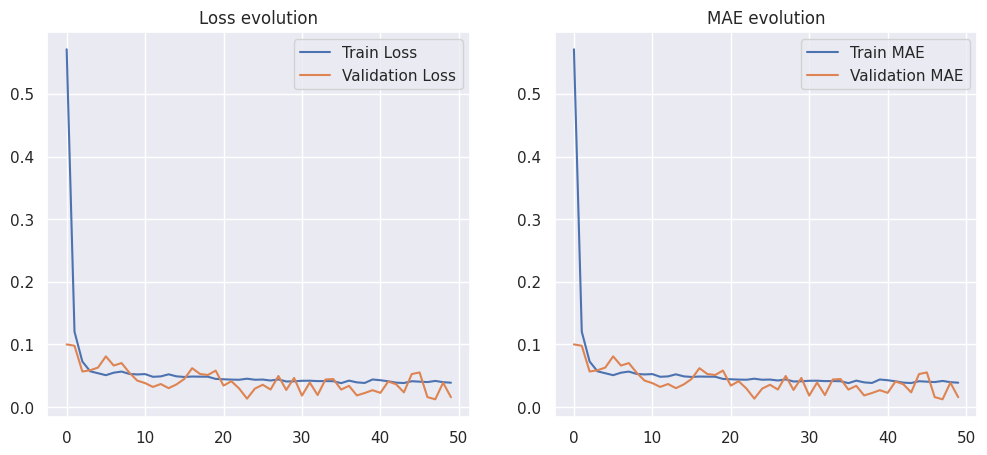

In [68]:
# Recupere as curvas de treinamento
history = best_estimator.model_.history

# Gere gráficos de perda e acurácia
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Loss evolution')

plt.subplot(1, 2, 2)
plt.plot(history.history['mae'], label='Train MAE')
plt.plot(history.history['val_mae'], label='Validation MAE')
plt.legend()
plt.title('MAE evolution')

plt.show()

In [136]:
testt = keras_clf.get_params().keys()
testt

dict_keys(['model', 'build_fn', 'warm_start', 'random_state', 'optimizer', 'loss', 'metrics', 'batch_size', 'validation_batch_size', 'verbose', 'callbacks', 'validation_split', 'shuffle', 'run_eagerly', 'epochs', 'dropout', 'hidden_layer_sizes', 'learning_rate'])

43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
[0.39864725 0.414648   0.40898952 ... 0.38382295 0.40127477 0.3972636 ]
MSE: 0.0008737094628452259
MAE Normalizado: 0.023242188722174095 - MAE Normal: 114.37668522934224


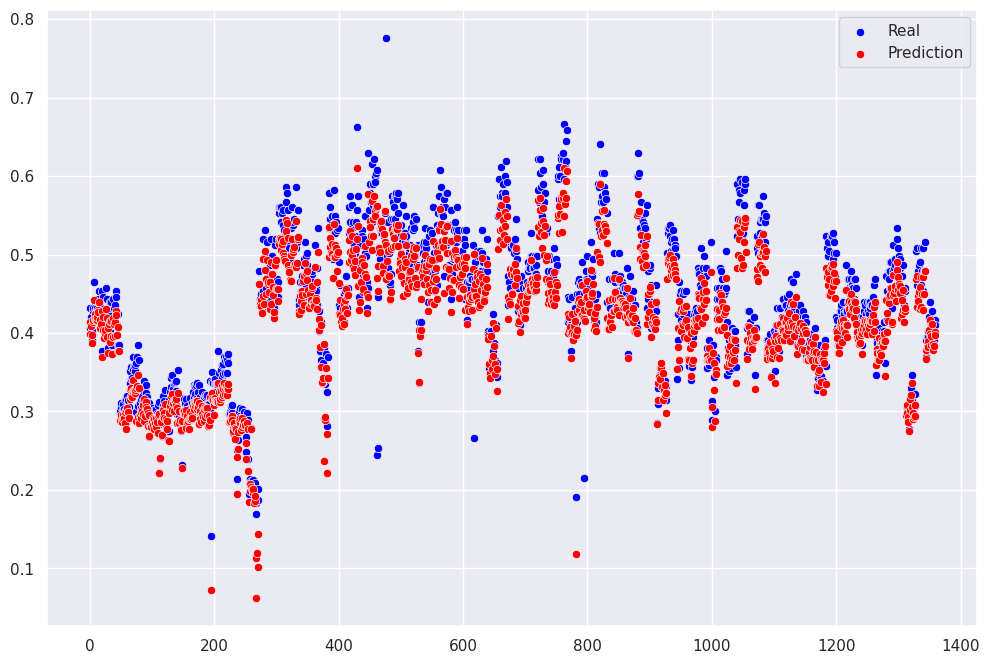

In [140]:
pred_val = grid_result.predict(X_val)
pred_inv_val = np.array(ysc.inverse_transform(pred_val))
print(pred_val.reshape(-1))
print("MSE:", mean_squared_error(y_val, pred_val))
print("MAE Normalizado:", mean_absolute_error(y_val, pred_val), "- MAE Normal:", mean_absolute_error(y_val, pred_inv_val))
plt.figure(figsize=(12,8))
sns.scatterplot(y_val.reshape(-1), color='blue', label='Real')
sns.scatterplot(pred_val.reshape(-1), color='red', label='Prediction')
plt.legend()
plt.show()

675/675 ━━━━━━━━━━━━━━━━━━━━ 1s 954us/step
[ 0.4247227   0.44994634  0.42863166 ... -4.075638   -4.09959
 -4.182808  ]
MSE: 4.638654765847124
MAE: 1.6764317551644743


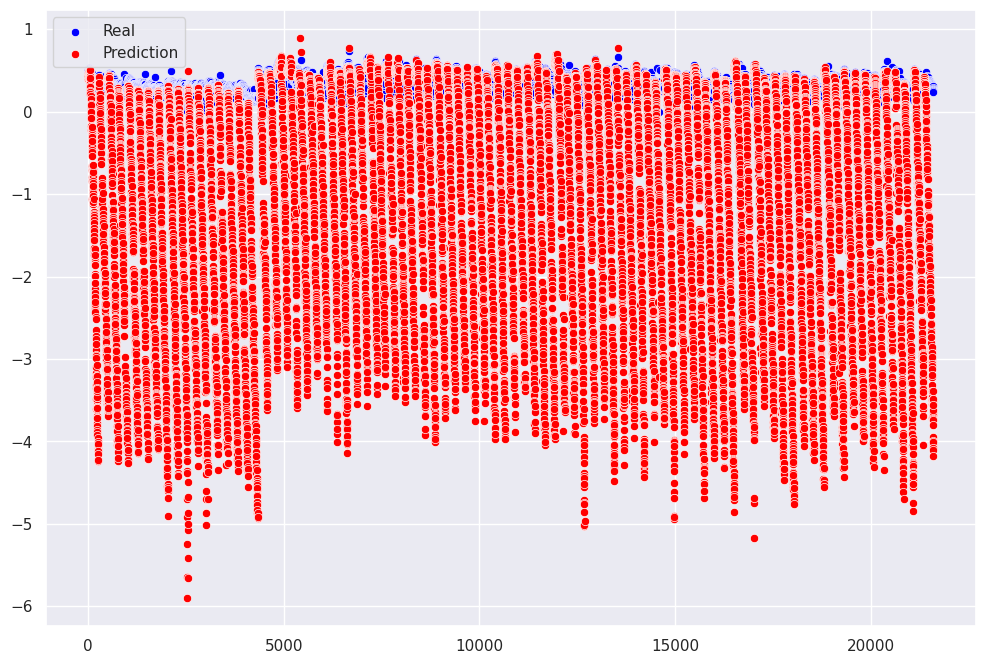

In [41]:
pred = grid_result.predict(X_test)
print(pred.reshape(-1))
print("MSE:", mean_squared_error(y_test, pred))
print("MAE:", mean_absolute_error(y_test, pred))
plt.figure(figsize=(12,8))
sns.scatterplot(y_test.reshape(-1), color='blue', label='Real')
sns.scatterplot(pred.reshape(-1), color='red', label='Prediction')
plt.legend()
plt.show()

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


/tmp/ipykernel_1310489/2774742328.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(1, 2, figsize=(12, 8))


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
8/8 ━━━━━━━━

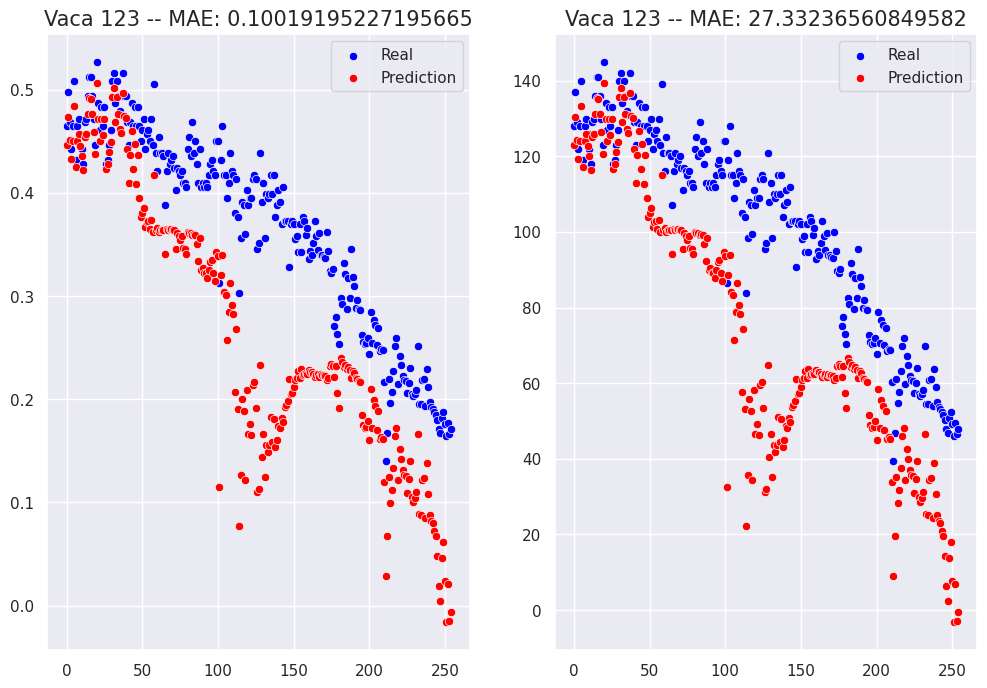

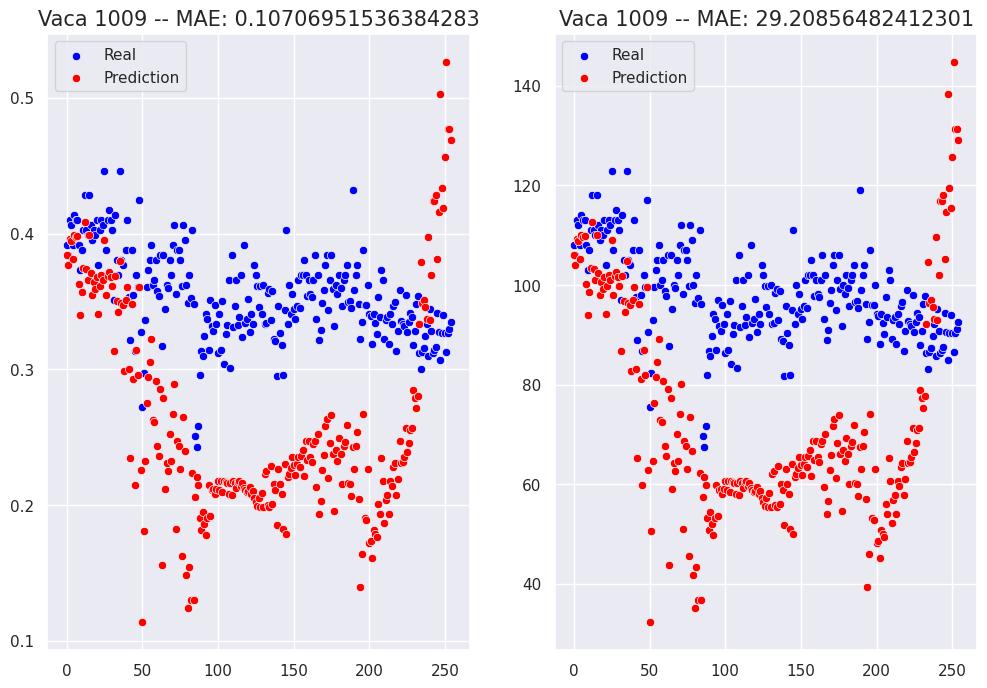

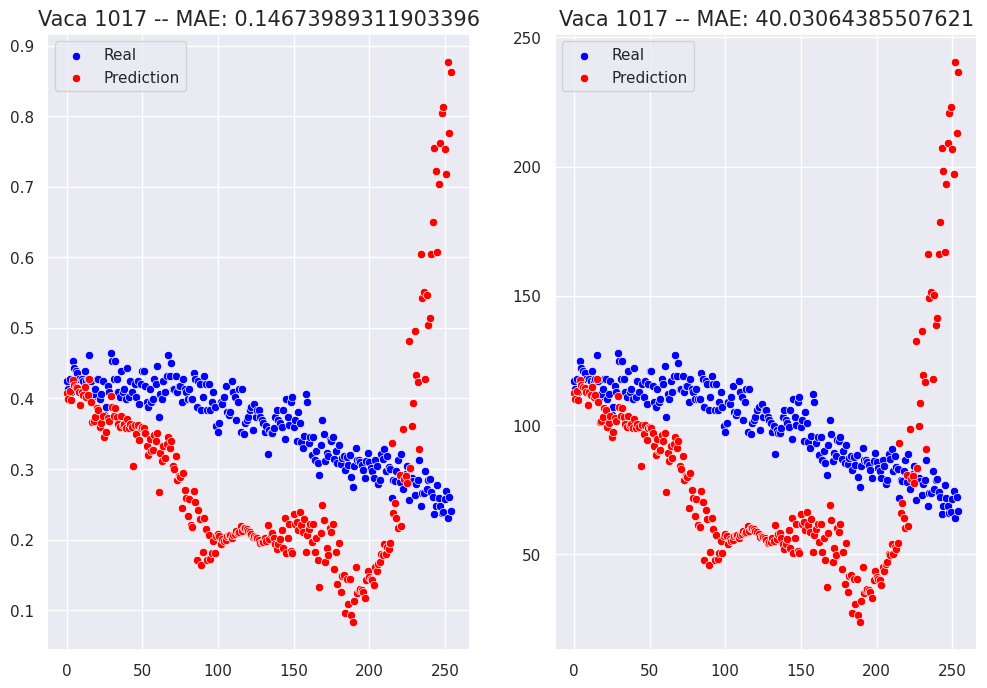

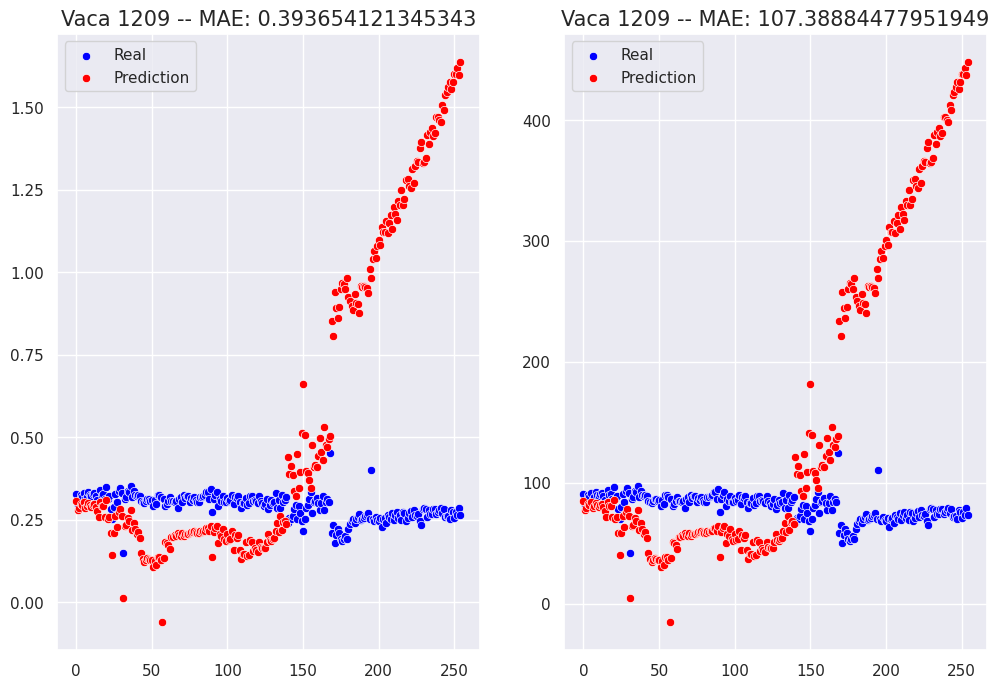

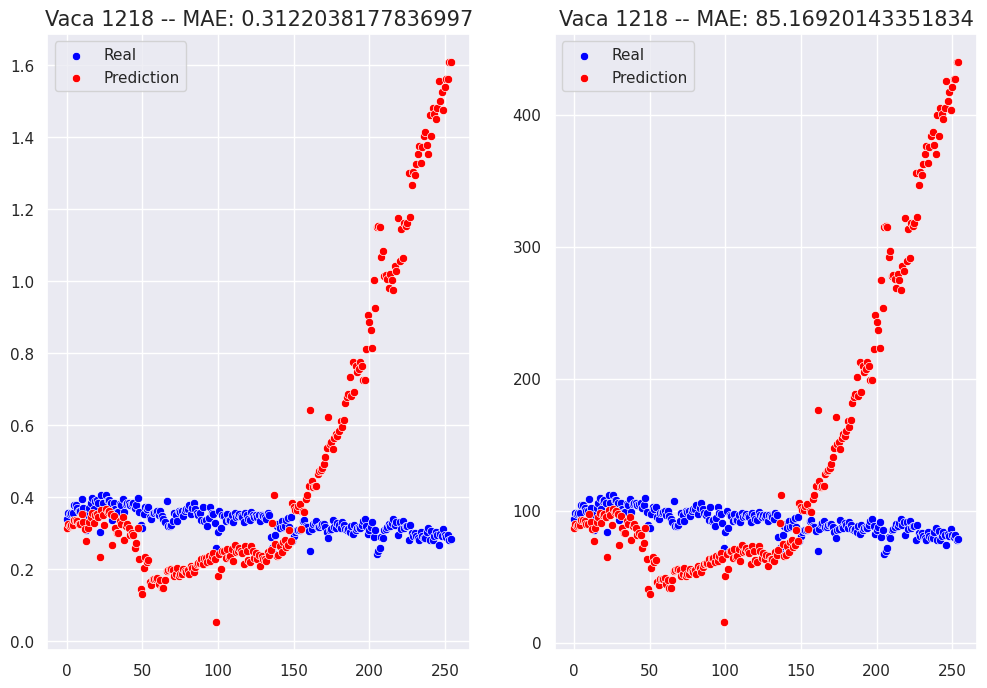

...

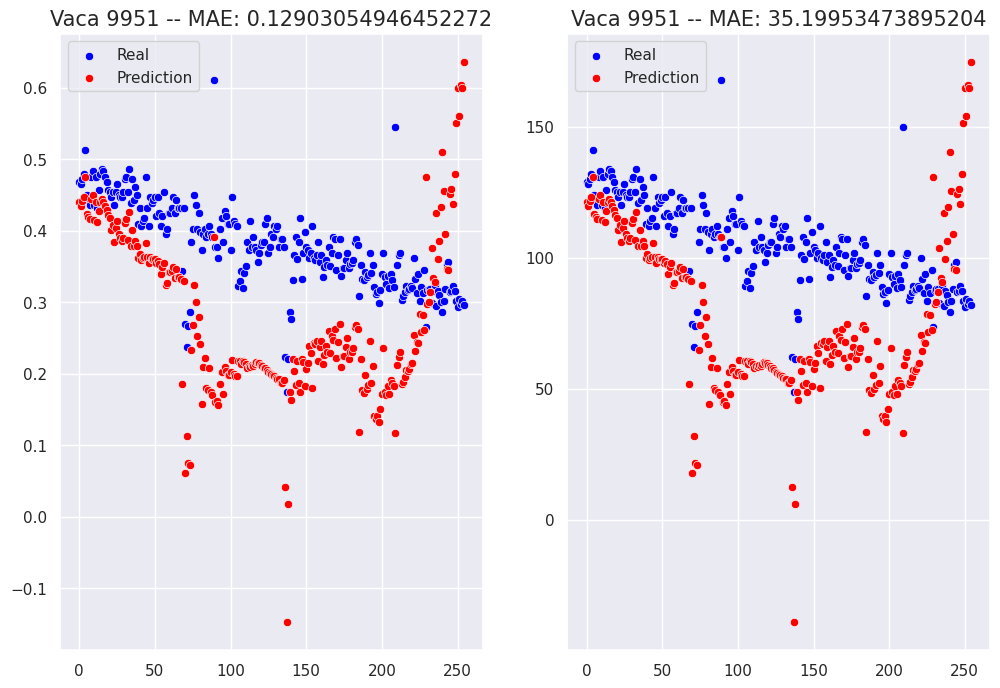

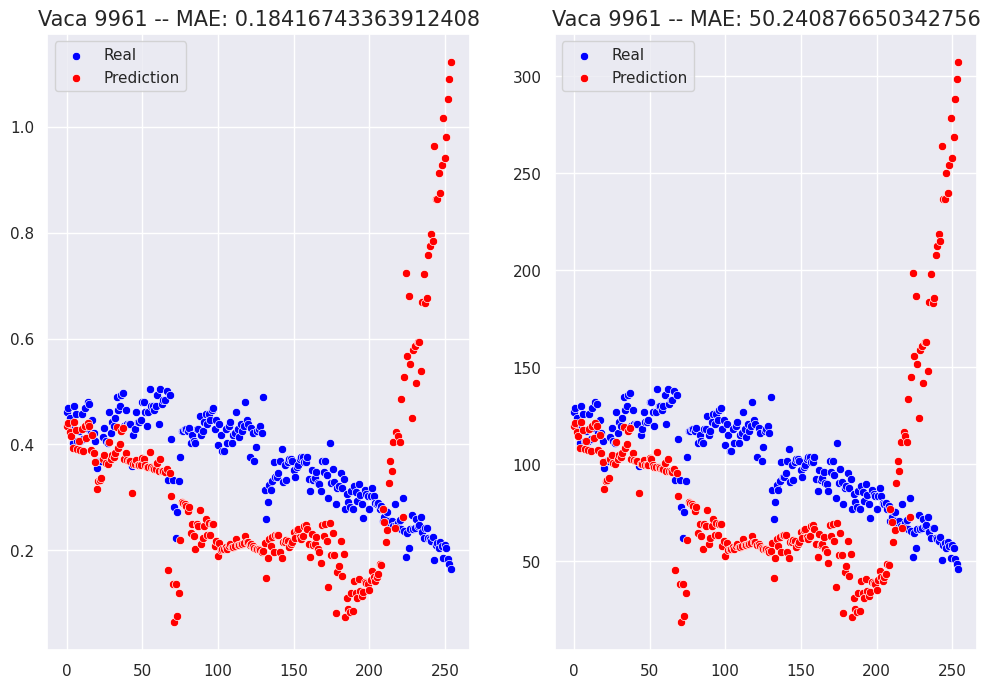

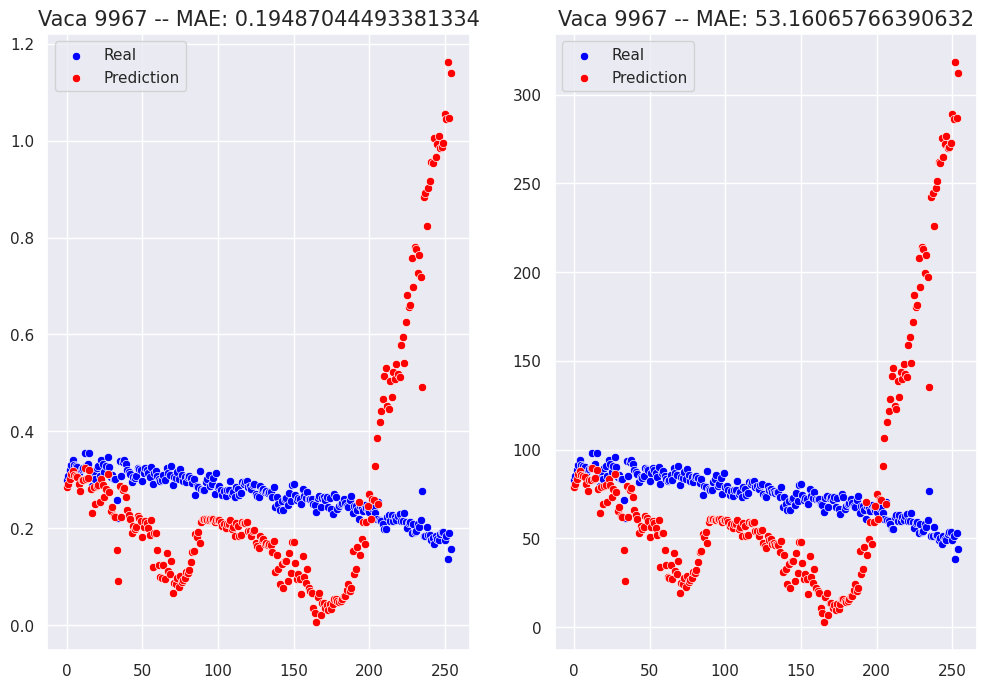

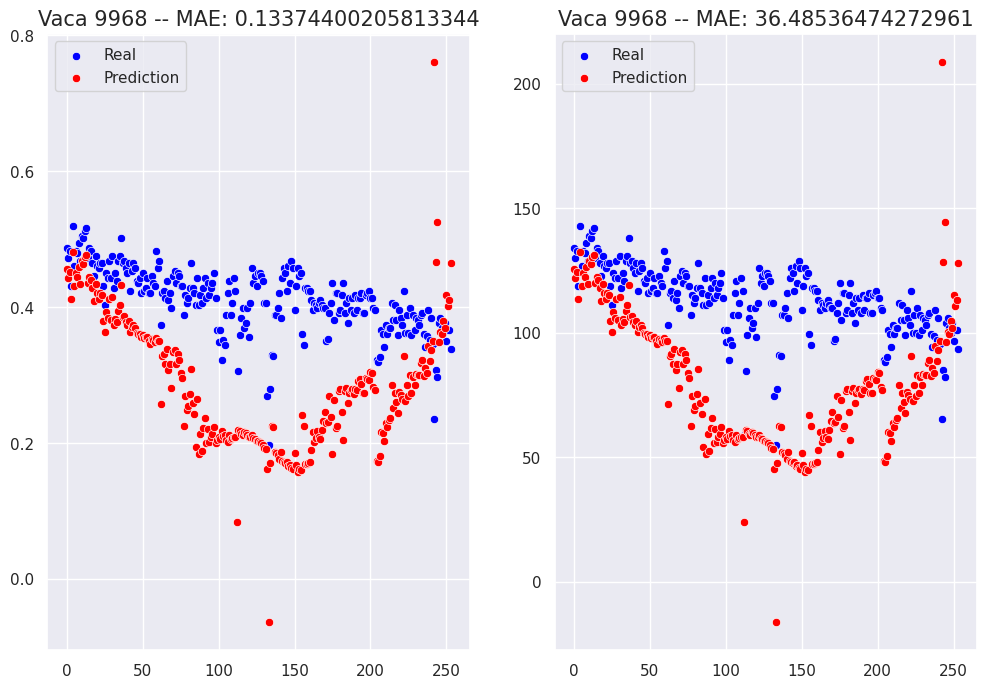

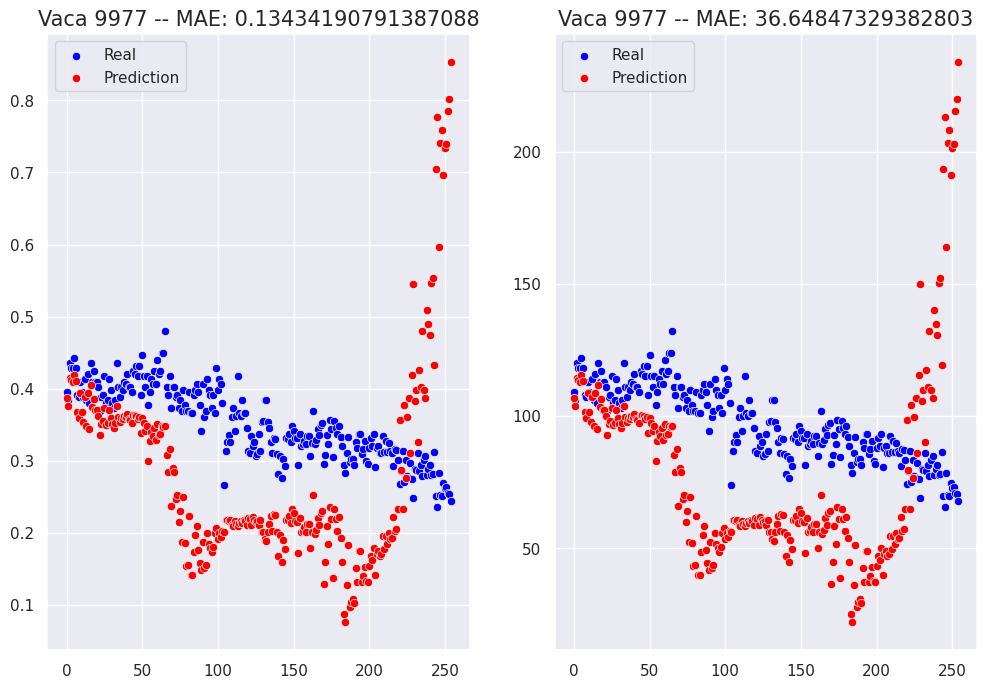

In [141]:
save_dir = 'images/outputMLP'

index_aux = 0
janela_entre_vacas = 0
for vaca in codigos_vacas:
    xs = []
    ys = []
    comprimento_serie = len(df_milk[df_milk["AnEar"]==vaca])
    janela_entre_vacas += comprimento_serie - tam_janela
    #print(janela_entre_vacas)
    for i in range(index_aux, janela_entre_vacas, 1):
        xs.append(X_test[i])
        ys.append(y_test[i])

    ys = np.array(ys)
    preds = grid_result.predict(xs)
    pred = np.array(ysc.inverse_transform(preds))

    #print("YS:", ys)
    #print("PRED:", preds)

    fig, axes = plt.subplots(1, 2, figsize=(12, 8))
    sns.scatterplot(ys.reshape(-1), color='blue', label='Real', ax=axes[0])
    sns.scatterplot(preds.reshape(-1), color='red', label='Prediction', ax=axes[0])
    axes[0].set_title(f'Vaca {vaca} -- MAE: {mean_absolute_error(ys, preds)}', fontsize=15)

    ys = ysc.inverse_transform(ys)
    sns.scatterplot(ys.reshape(-1), color='blue', label='Real', ax=axes[1])
    sns.scatterplot(pred.reshape(-1), color='red', label='Prediction', ax=axes[1])
    axes[1].set_title(f'Vaca {vaca} -- MAE: {mean_absolute_error(ys, pred)}', fontsize=15)
    
    index_aux = janela_entre_vacas
    
    plt.plot()
    
    # Salvando o gráfico
    # Se não existir o diretório, cria um
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)
    fig.savefig(os.path.join(save_dir, f'vaca_{vaca}.png'))

In [98]:
len(xs)

255

In [35]:
# Criando o objeto KerasClassifier
#keras_clf = KerasRegressor(model = get_model, loss="mean_squared_error", optimizer="adam", optimizer__learning_rate= 0.1, hidden_layer_sizes = 100, dropout = 0.0, batch_size=32, verbose=False)
#keras_clf = KerasRegressor(model= get_model(), dropout=0.3,  hidden_layer_sizes= 256, learnRate=1e-2, verbose=False)
keras_clf_2 = KerasRegressor(model=get_model, dropout=0.3, hidden_layer_sizes=256, learning_rate=0.01, loss=mean_absolute_error)

# Definindo os valores dos hiperparâmetros - Espaço de busca
hidden_layer_sizes = [256]
learnRate = [1e-2, 1e-3]
dropout = [0.3, 0.4]
batchSize = [16]

# Cria um dicionário dos hiperparâmetros para GridSearchCV
grid = dict(
	hidden_layer_sizes=hidden_layer_sizes,
	learning_rate=learnRate,
	dropout=dropout,
	batch_size=batchSize
)

## Definindo os valores dos hiperparâmetros
#parameters = {
#    'optimizer': ['sgd', 'adam'],
#    'optimizer__learning_rate': [0.1, 0.001, 0.0001],
#    'model__dropout': [0.3, 0.4, 0.5],
#    'model__hidden_layer_sizes': [100, 300, 600]
#}

# Criando o objeto GridSearchCV
grid_search_2 = GridSearchCV(estimator=keras_clf_2, param_grid=grid, n_jobs=3, cv=5, error_score='raise')

#tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir="tensorboard", histogram_freq=5000, update_freq='batch', write_grads=True)
tensorboard_callback_2 = tf.keras.callbacks.TensorBoard(log_dir=log_dir, update_freq='batch')

# Treinando o grid search
grid_result_2 = grid_search_2.fit(X_train, y_train, epochs=10, validation_data=(X_val,y_val), callbacks=[tensorboard_callback_2, early_stopping])




print(grid_result_2.best_score_, grid_result_2.best_params_)
means = grid_result_2.cv_results_['mean_test_score']
stds = grid_result_2.cv_results_['std_test_score']
params = grid_result_2.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

2024-05-09 00:14:04.183609: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-09 00:14:04.183611: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-09 00:14:04.183638: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-09 00:14:04.183659: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-09 00:14:04.184663: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory

Epoch 1/10
Epoch 1/10
Epoch 1/10


I0000 00:00:1715224506.945107   14443 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
I0000 00:00:1715224507.206463   14438 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
I0000 00:00:1715224509.167040   14433 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


149/149 ━━━━━━━━━━━━━━━━━━━━ 76s 281ms/step - loss: 1.0756 - mae: 1.0756 - val_loss: 0.0908 - val_mae: 0.0908
Epoch 2/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.1376 - mae: 0.1376 - val_loss: 0.0687 - val_mae: 0.0687
Epoch 3/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0691 - mae: 0.0691 - val_loss: 0.0257 - val_mae: 0.0257
Epoch 4/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0667 - mae: 0.0667 - val_loss: 0.0619 - val_mae: 0.0619
Epoch 5/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 76s 243ms/step - loss: 1.0467 - mae: 1.0467 - val_loss: 0.2223 - val_mae: 0.2223
Epoch 2/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.1334 - mae: 0.1334 - val_loss: 0.0875 - val_mae: 0.0875
Epoch 3/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 76s 242ms/step - loss: 1.0813 - mae: 1.0813 - val_loss: 0.0797 - val_mae: 0.0797
Epoch 2/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.1373 - mae: 0.1373 - val_loss: 0.0461 - val_mae: 0.0461
Epoch 3/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - los

/home/iago/posgraduacao/.venv/lib/python3.10/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


138/149 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.1107 - mae: 1.1107

2024-05-09 00:18:00.997130: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-09 00:18:00.997452: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-09 00:18:01.007614: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-05-09 00:18:02.078267: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


125/149 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0336 - mae: 1.0336Epoch 1/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 1.0967 - mae: 1.0967 - val_loss: 0.3115 - val_mae: 0.3115
Epoch 2/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - loss: 0.6528 - mae: 0.6528 - val_loss: 0.2326 - val_mae: 0.2326
Epoch 3/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.4181 - mae: 0.4181 - val_loss: 0.1909 - val_mae: 0.1909
Epoch 4/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 37s 150ms/step - loss: 1.0108 - mae: 1.0108 - val_loss: 0.2697 - val_mae: 0.2697
Epoch 2/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - loss: 0.2470 - mae: 0.2470 - val_loss: 0.3027 - val_mae: 0.3027
Epoch 5/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.1323 - mae: 0.1323 - val_loss: 0.2139 - val_mae: 0.2139
Epoch 6/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.6556 - mae: 0.6556 - val_loss: 0.1723 - val_mae: 0.1723
Epoch 3/10
133/149 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0816 - mae: 0.0816

I0000 00:00:1715224710.609530   19835 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


149/149 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0812 - mae: 0.0812 - val_loss: 0.1395 - val_mae: 0.1395
Epoch 7/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0695 - mae: 0.0695 - val_loss: 0.1342 - val_mae: 0.1342
Epoch 8/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.4037 - mae: 0.4037 - val_loss: 0.1000 - val_mae: 0.1000
Epoch 4/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.2467 - mae: 0.2467 - val_loss: 0.2358 - val_mae: 0.2358
Epoch 5/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 7s 46ms/step - loss: 0.0693 - mae: 0.0693 - val_loss: 0.1931 - val_mae: 0.1931
Epoch 9/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - loss: 0.1322 - mae: 0.1322 - val_loss: 0.1594 - val_mae: 0.1594
Epoch 6/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0711 - mae: 0.0711 - val_loss: 0.1197 - val_mae: 0.1197
Epoch 10/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0659 - mae: 0.0659 - val_loss: 0.1232 - val_mae: 0.1232
149/149 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0801 - mae

2024-05-09 00:19:04.720629: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-09 00:19:04.721177: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-09 00:19:04.743878: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


149/149 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0693 - mae: 0.0693 - val_loss: 0.1071 - val_mae: 0.1071
 1/38 ━━━━━━━━━━━━━━━━━━━━ 11s 316ms/step

2024-05-09 00:19:05.509691: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-09 00:19:05.509731: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-09 00:19:05.511844: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step


2024-05-09 00:19:06.051396: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-05-09 00:19:06.463459: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


Epoch 1/10
Epoch 1/10
Epoch 1/10
141/149 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 1.1963 - mae: 1.1963

I0000 00:00:1715224774.757853   22137 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
I0000 00:00:1715224776.641474   22160 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


149/149 ━━━━━━━━━━━━━━━━━━━━ 40s 167ms/step - loss: 1.1663 - mae: 1.1663 - val_loss: 0.1137 - val_mae: 0.1137
Epoch 2/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.1820 - mae: 0.1820 - val_loss: 0.0836 - val_mae: 0.0836
Epoch 3/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0782 - mae: 0.0782 - val_loss: 0.0646 - val_mae: 0.0646
Epoch 4/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0715 - mae: 0.0715 - val_loss: 0.0617 - val_mae: 0.0617
Epoch 5/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0705 - mae: 0.0705 - val_loss: 0.0573 - val_mae: 0.0573
Epoch 6/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0735 - mae: 0.0735 - val_loss: 0.1041 - val_mae: 0.1041
Epoch 7/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0702 - mae: 0.0702 - val_loss: 0.1196 - val_mae: 0.1196
Epoch 8/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 6s 43ms/step - loss: 0.0747 - mae: 0.0747 - val_loss: 0.0765 - val_mae: 0.0765
Epoch 9/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0

2024-05-09 00:22:18.406961: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-09 00:22:18.407961: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-09 00:22:18.424769: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


149/149 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0751 - mae: 0.0751 - val_loss: 0.1789 - val_mae: 0.1789
Epoch 10/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 0.0850 - mae: 0.0850 - val_loss: 0.1508 - val_mae: 0.1508
Epoch 8/10
123/149 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0828 - mae: 0.0828

2024-05-09 00:22:19.908969: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


149/149 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0827 - mae: 0.0827 - val_loss: 0.1766 - val_mae: 0.1766
Epoch 9/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 0.0723 - mae: 0.0723 - val_loss: 0.1751 - val_mae: 0.1751
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
Epoch 1/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 0.0783 - mae: 0.0783 - val_loss: 0.1048 - val_mae: 0.1048
Epoch 10/10
143/149 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0814 - mae: 0.0814Epoch 1/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 0.0813 - mae: 0.0813 - val_loss: 0.1643 - val_mae: 0.1643
38/38 ━━━━━━━━━━━━━━━━━━━━ 7s 170ms/step
128/149 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1624 - mae: 1.1624

I0000 00:00:1715224962.541861   28871 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


149/149 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - loss: 1.1371 - mae: 1.1371 - val_loss: 0.3489 - val_mae: 0.3489
Epoch 2/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.6872 - mae: 0.6872 - val_loss: 0.1017 - val_mae: 0.1017
Epoch 3/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3899 - mae: 0.3899 - val_loss: 0.1053 - val_mae: 0.1053
Epoch 4/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.2112 - mae: 0.2112 - val_loss: 0.1659 - val_mae: 0.1659
Epoch 5/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.1137 - mae: 0.1137 - val_loss: 0.1701 - val_mae: 0.1701
Epoch 6/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0927 - mae: 0.0927 - val_loss: 0.1543 - val_mae: 0.1543
Epoch 7/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0844 - mae: 0.0844 - val_loss: 0.1229 - val_mae: 0.1229
Epoch 8/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 33s 85ms/step - loss: 1.2385 - mae: 1.2385 - val_loss: 0.1218 - val_mae: 0.1218
Epoch 2/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0

2024-05-09 00:23:05.498512: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-05-09 00:23:05.502256: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-05-09 00:23:05.502338: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-05-09 00:23:05.963171: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-05-09 00:23:05.963891: I external/local_xla/xla/stream_executor

Epoch 1/10


2024-05-09 00:23:09.047630: I external/local_xla/xla/service/service.cc:168] XLA service 0x55fff6faa680 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-05-09 00:23:09.047687: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 4050 Laptop GPU, Compute Capability 8.9
2024-05-09 00:23:09.123143: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-05-09 00:23:09.710115: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8904
2024-05-09 00:23:11.249897: I external/local_tsl/tsl/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory


 26/186 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.7901 - mae: 1.7901

I0000 00:00:1715224994.080504   30653 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


186/186 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - loss: 0.9790 - mae: 0.9790 - val_loss: 0.0839 - val_mae: 0.0839
Epoch 2/10
186/186 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0898 - mae: 0.0898 - val_loss: 0.0488 - val_mae: 0.0488
Epoch 3/10
186/186 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0643 - mae: 0.0643 - val_loss: 0.0716 - val_mae: 0.0716
Epoch 4/10
186/186 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0689 - mae: 0.0689 - val_loss: 0.0653 - val_mae: 0.0653
Epoch 5/10
186/186 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0678 - mae: 0.0678 - val_loss: 0.0471 - val_mae: 0.0471
Epoch 6/10
186/186 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0656 - mae: 0.0656 - val_loss: 0.0676 - val_mae: 0.0676
Epoch 7/10
186/186 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0657 - mae: 0.0657 - val_loss: 0.0662 - val_mae: 0.0662
Epoch 8/10
186/186 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0627 - mae: 0.0627 - val_loss: 0.0310 - val_mae: 0.0310
Epoch 9/10
186/186 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.061